# Depth estimation algorithm for a single image

### Importing Resources

In [238]:
import matplotlib.pyplot as plt 
import numpy as np

In [239]:
from skimage.color import rgb2gray
from skimage import data
from skimage.segmentation import active_contour
from skimage.draw import polygon_perimeter

from skimage.filters import sobel
from skimage.filters import laplace
from skimage.feature import canny
from skimage import measure
from skimage.io import imread

In [271]:
import os

## YOLO algorithm:

source: https://github.com/Garima13a/YOLO-Object-Detection

### Importing Resources

In [240]:
import cv2

from YOLO.utils import *
from YOLO.darknet import Darknet

#import numpy as np
#import matplotlib.pyplot as plt

### Setting Up The Neural Network
*Remember to download the [`YOLO weights`](https://mega.nz/#F!RUBB3YYJ!pbAz28PVzJnN4Vuq4KA5mg) and save them inside a folder called "weights" (has to be created)*

In [241]:
# Set the location and name of the cfg file
cfg_file = './YOLO/cfg/yolov3.cfg'

# Set the location and name of the pre-trained weights file
weight_file = './YOLO/weights/yolov3.weights'

# Set the location and name of the COCO object classes file
namesfile = 'YOLO/data/coco.names'

# Load the network architecture
m = Darknet(cfg_file)

# Load the pre-trained weights
m.load_weights(weight_file)

# Load the COCO object classes
class_names = load_class_names(namesfile)

### Object Detection

In [242]:
def YOLO_object_detection(img_path, show = False):
    # Set the default figure size
    plt.rcParams['figure.figsize'] = [24.0, 14.0]

    # Load the image   
    img = cv2.imread(img_path)

    # Convert the image to RGB
    original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # We resize the image to the input width and height of the first layer of the network.    
    resized_image = cv2.resize(original_image, (m.width, m.height))

    # Set the IOU threshold. Default value is 0.4
    iou_thresh = 0.4

    # Set the NMS threshold. Default value is 0.6
    nms_thresh = 0.6

    # Detect objects in the image
    boxes = detect_objects(m, resized_image, iou_thresh, nms_thresh)
    
    if(show):
        # Print the objects found and the confidence level
        print_objects(boxes, class_names)

        #Plot the image with bounding boxes and corresponding object class labels
        plot_boxes(original_image, boxes, class_names, plot_labels = True)
    
    return img, boxes

#### E.g. 



It took 2.440 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. person: 1.000000


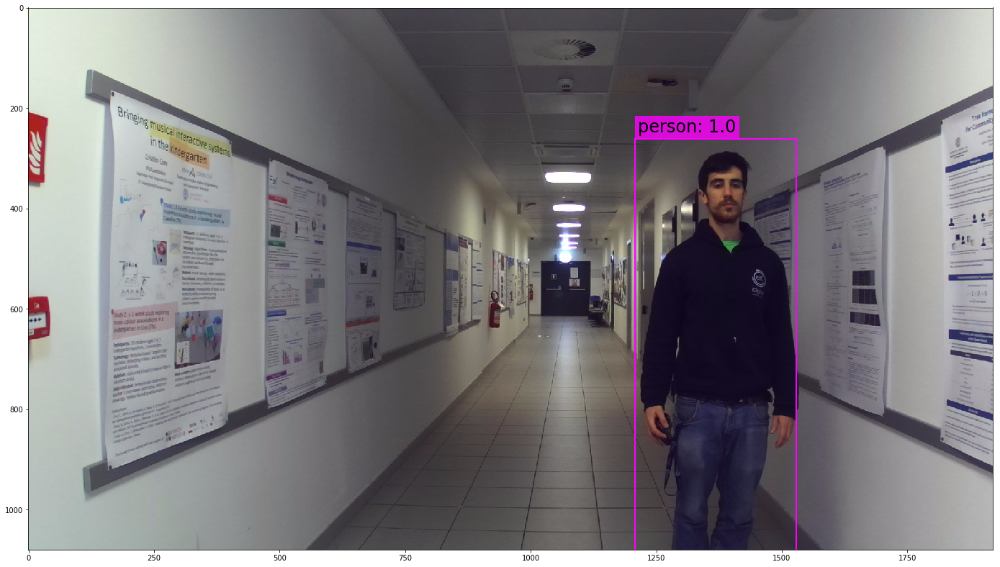

In [243]:
eg_img_path = 'preprocessing-of-images/left-crop/H_DB_08.png'
eg_img,eg_boxes = YOLO_object_detection(eg_img_path, True);

### Bounding box vertexes

From the YOLO algorithm, we retrieve the bounding box vertexes coordinates (x1,y1,x2,y2). These coordinates will be used later on to create a mask for the canny edge detector.

In [244]:
def bb_vertexes(img, boxes, show = False):
    
    bb_param = [None]*len(boxes)
    # REF: plot_boxes from utils.py
    # Get the width and height of the image
    width = img.shape[1]
    height = img.shape[0]  

    # Plot the bounding boxes and corresponding labels on top of the image
    for i in range(len(boxes)):        
        # Get the ith bounding box
        box = boxes[i]

        # Get the (x,y) pixel coordinates of the lower-left and lower-right corners
        # of the bounding box relative to the size of the image. 
        x1 = int(np.around((box[0] - box[2]/2.0) * width))
        y1 = int(np.around((box[1] - box[3]/2.0) * height))
        x2 = int(np.around((box[0] + box[2]/2.0) * width))
        y2 = int(np.around((box[1] + box[3]/2.0) * height))
        
        #Check for bb vertexes out of image bounds
        if(x1 < 0):
            x1 = 0
        if(y1 < 0):
            y1 = 0
        if(x2 > width):
            x2 = (int)(width)
        if(y2 > height):
            y2 = (int)(height)            

        if(show):
            print("Box",i,"--> x1,y1:(", x1,",",y1, ") / x2,y2:(", x2,",",y2, ")")
            
        #save bounding box parameters
        bb_param[i] = [x1,x2,y1,y2]        
    
    return bb_param

#### E.g.

In [245]:
eg_bb_param = bb_vertexes(eg_img, eg_boxes, True)

Box 0 --> x1,y1:( 1208 , 261 ) / x2,y2:( 1529 , 1080 )


## Depth estimation processing

### Load depth image

Output of our monodepth2 model

Code: https://github.com/AlvaroRubioGomez/depth-estimation-project/
--> Minor changes has been done to the original code (available in source). The code now returns the depth estimation as a relative depth estimation without applying any scale. The scale will be estimated later on this jupyter notebook.

Source: https://github.com/nianticlabs/monodepth2



In [246]:
def load_depth_img_data(depth_img_path, depth_data_path, show=False):
    #Depth image
    depth_img = imread(depth_img_path)   

    #Depth data
    depth_data = np.load(depth_data_path)
    
    if(show):
        plt.imshow(depth_img)
        print("Estimated depth information:")
        print(depth_data)
        
    return depth_img, depth_data

#### E.g.

Estimated depth information:
[[[[0.95904845 0.95851016 0.9575532  ... 0.9291765  0.92958236
    0.9298107 ]
   [0.95904845 0.95851016 0.9575532  ... 0.9291765  0.92958236
    0.9298107 ]
   [0.95897716 0.9584442  0.9574967  ... 0.9288438  0.92927355
    0.92951536]
   ...
   [0.5153927  0.5151218  0.5146403  ... 0.5731487  0.5753337
    0.57656276]
   [0.51563966 0.5154056  0.51498955 ... 0.57337195 0.57555526
    0.5767834 ]
   [0.51563966 0.51540565 0.51498955 ... 0.573372   0.5755553
    0.5767834 ]]]]


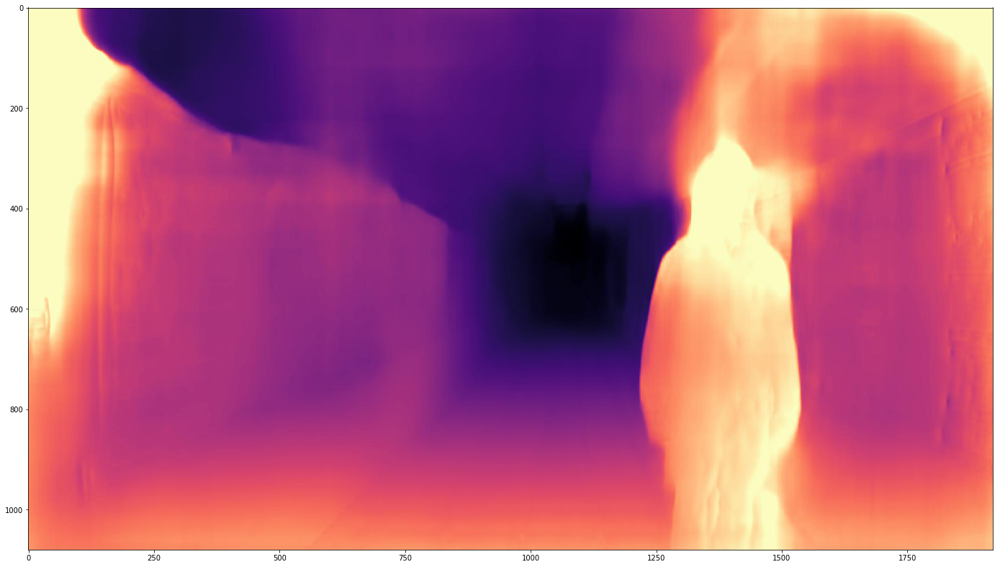

In [247]:
eg_depth_img_path = 'monodepth2/assets/monodepth2_output/H_DB_08_disp.jpeg'
eg_depth_data_path = 'monodepth2/assets/monodepth2_output/H_DB_08_disp.npy'
eg_depth_img, eg_depth_data = load_depth_img_data(eg_depth_img_path, eg_depth_data_path, True);

### Find the contours of the person

Once we have detected the person, we want to extract the contour. To do so, we compare the perform of two edge detectors: sobel and canny.

As it can be seen in the example, the output of canny results more refined and located. Canny edge detector allows to use a mask perform the edge detector in an specific area of the image. We have used the bounding box of the YOLO object detector as a mask for this purpose.

In [248]:
def find_object_contours_sobel(img, bb_param, level, show = False):    
    
    img_gray = rgb2gray(img)   
    
    #create mask for canny detector
    mask = np.ones(img_gray.shape)
    #yolo bounding box parameters
    for box in bb_param:         
        for x in range(box[0],box[1]): #(x1,x2)
            for y in range(box[2],box[3]): #(y1,y2)
                mask[y][x]= 0; #[row][col]
        mask = mask < 1

    #Edge filter    
    img_edges_sobel = sobel(img_gray, mask=mask) #sobel

    #Contours detectors    
    contours_sobel = measure.find_contours(img_edges_sobel, level,'high','high')

    if(show):
        #plot sobel filter
        fig1, ax1 = plt.subplots()
        ax1.imshow(img_edges_sobel, cmap=plt.cm.gray)

        for n, contour in enumerate(contours_sobel):    
            ax1.plot(contour[:, 1], contour[:, 0], linewidth=2)
        
        plt.show()

    return contours_sobel   

#### E.g.

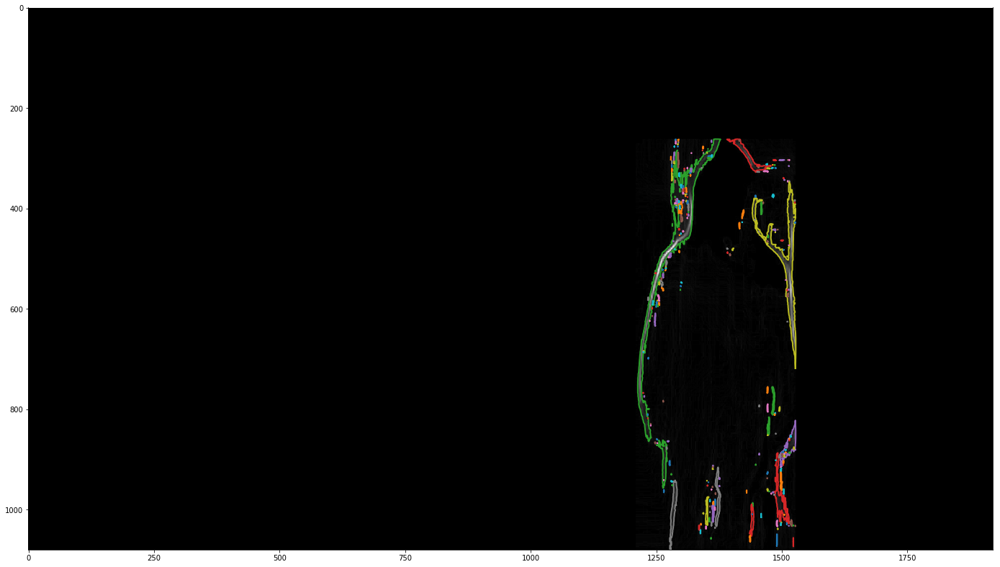

In [249]:
# Sobel edge detector
level = 0.015
eg_object_contours_sobel = find_object_contours_sobel(eg_depth_img, eg_bb_param, level, True);

#### Calculate low and high threshold for canny

In the canny edge detector, a double threshold is applied to determine potential edges. Here extraneous pixels caused by noise or milder color variation than desired are eliminated. If a pixel’s gradient value – based on the Sobel differential – is above the high threshold value, it is considered a strong candidate for an edge. If the gradient is below the low threshold value, it is turned off. If the gradient is in between, the pixel is considered a weak candidate for an edge pixel.

In [250]:
def calculate_low_high_threshold(depth_data, bb_param, show = False):   
    
    # whole picture depth and bounding box depth data
    depth = depth_data[0][0]   
    for box in bb_param:       
        bb_depth = depth[box[2]:box[3],box[0]:box[1]] # [y1:y2, x1:x2]    
    
    # High treshold is calculated in an empirical way for this particular application
    # We take the closest and the furthest subject and calculate the mean inside the bounding box
    # normalize with the whole picture value. Then, we compute a linear relationship between 
    # high threshold (selected by trial and error in each base case) and its normalize mean.
    # Low threshold is a half of the high treshold
    # This has a lot of room for improvement
    
    # Normalize mean inside the bounding box
    min_value = min(np.hstack(depth))
    max_value = max(np.hstack(depth))
    bb_mean = bb_depth.mean()   
    bb_norm_mean = (bb_mean - min_value)/(max_value - min_value) 
    
    # high treshold
    # empirical values: high_t = 0.1, norm_mean = 0.22 / high_t = 0.2, norm_mean = 0.52 (furthest/closest)
    m = 1/3
    b = 2/75
    high_t = m*bb_norm_mean + b 
    
    # low treshold
    low_t = high_t/2
    
    if(show):
        print("mean_norm inside bb:",bb_norm_mean)   
        print("low_t:", low_t, "/ high_t:", high_t)
        
    return low_t, high_t

In [251]:
eg_low_t, eg_high_t = calculate_low_high_threshold(eg_depth_data, eg_bb_param, True)

mean_norm inside bb: 0.5226024
low_t: 0.10043372988700866 / high_t: 0.20086745977401732


In [252]:
def find_object_contours_canny(img, bb_param, low_t=0.1, high_t=0.2, show = False):
    
    level = 0.02
    
    img_gray = rgb2gray(img)

    #create mask for canny detector
    mask = np.ones(img_gray.shape)
    #yolo bounding box parameters
    for box in bb_param:         
        for x in range(box[0],box[1]): #(x1,x2)
            for y in range(box[2],box[3]): #(y1,y2)
                mask[y][x]= 0; #[row][col]
        mask = mask < 1

    #Edge filter     
    img_edges_canny = canny(img_gray, sigma=1, low_threshold=low_t, high_threshold=high_t, mask=mask) #canny
    #img_edges_canny = canny(img_gray, sigma=1, low_threshold=low_t, high_threshold=high_t) #canny
    
    #Contours detectors    
    contours_canny = measure.find_contours(img_edges_canny, level, 'high','high')

    if(show):
        #plot canny filter
        fig2, ax2 = plt.subplots()
        ax2.imshow(img_edges_canny, cmap=plt.cm.gray)

        for n, contour in enumerate(contours_canny): 
            ax2.plot(contour[:, 1], contour[:, 0], linewidth=2) 
        
        plt.show()

    return contours_canny   

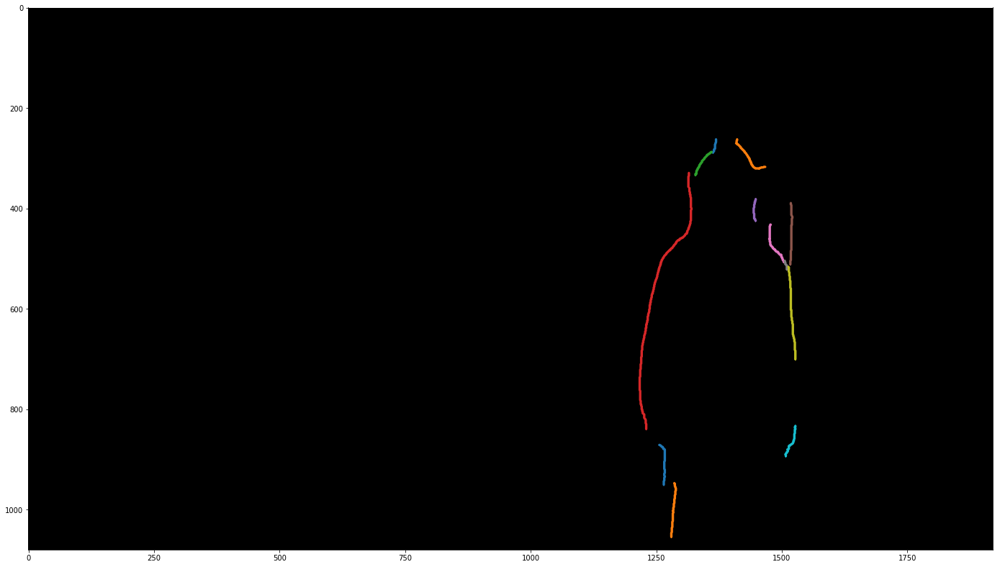

In [253]:
# Canny edge detector
eg_object_contours_canny = find_object_contours_canny(eg_depth_img, eg_bb_param, eg_low_t, eg_high_t, True);

### Stack all contours

*find_object_contours* returns a list of contours. Each contour is an ndarray of shape (n, 2), consisting of n (x, y) coordinates along the contour.

For the seek of convenience, we will stack all the contours in a single list and retrieve the x and y coordinates from this one in separated lists.

In addition, some operations are performed to "clean" the contours information, as for example, round the x,y coordinates to integers and eliminate duplicates (that appear from the last step).

In [254]:
def stack_contours(object_contours):
    all_contours = []
    all_contours_y = []
    all_contours_x = []

    for cont in object_contours:
        #round
        cont = np.around(cont)    
        #eliminate duplicates
        cont = [list(item) for item in set(tuple(row) for row in cont)]    
        #Stack all cont in one list
        all_contours = all_contours + cont

    for pixel in all_contours:
        all_contours_y.append(pixel[0])
        all_contours_x.append(pixel[1])   
    
    return all_contours, all_contours_y, all_contours_x

#### E.g.

In [255]:
eg_all_contours, eg_all_contours_y, eg_all_contours_x = stack_contours(eg_object_contours_canny);

### Eliminate background

Keeping only the depth information kept inside contours

##### *get_min_max_x*
To run our *eliminate_background* routine, we need to retrieve the minimum x and the maximum x in our contour list at a certain height y. To do so, we have created the *get_min_max_x* helper function.

In addition, our contour list *all_contours* may not have neither a minimum nor a maximum x at certain height y, i.e. contour is open from both,left and right, sides of the person figure.

*get_min_max_x* deals with these special base cases by stablishing minimum and maximum x to be its corresponding previous values.

In [256]:
def get_min_max_x(img_nb, y, all_contours_y,all_contours_x, min_x_prev, max_x_prev):
    #Get indexes for pixels from contours at certain row (y)
    indexPosList = [ i for i in range(len(all_contours_y)) if all_contours_y[i] == y ]    
    #Check for open contour from both sides
    if(len(indexPosList)==0):  #this will never happen at the very beginning of the contour
        #use previous boundaries
        min_x = min_x_prev
        max_x = max_x_prev
    else:
        #Initial values of min and max equals to the image boundaries
        min_x = img_nb.shape[1]
        max_x = 0
        #Get the min and max values for x
        for index in indexPosList:            
            if(all_contours_x[index] > max_x):
                max_x = all_contours_x[index]
            if(all_contours_x[index] < min_x):
                min_x = all_contours_x[index]
                
    return (int)(min_x),(int)(max_x)

##### *eliminate_background*

This function remove the pixel information outside the contour of the person by looping throught the image (up to down) and by the means of the minimum and maximum x information provided by *get_min_max_x* function.

In addition, this function understand when the minimum and maximum x provided belongs to the same contour side (due to the width inherent to the contour) and solve this issue by retrieving the corresponding previous value of maximum or minimum x.

In [257]:
def eliminate_background(depth_img, all_contours_y, all_contours_x, show=False):
    
    # Create a copy of img_nb
    img_nb = depth_img.copy()

    # Eliminate everything up and down to the contour
    c_first_y = (int)(min(all_contours_y)) #first row where there is contour
    c_last_y = (int)(max(all_contours_y)) #last row where there is contour
    for y in range(0, img_nb.shape[0]):
        for x in range(0, img_nb.shape[1]):
            if( y < c_first_y or y > c_last_y): 
                img_nb[y][x] = [0,0,0]

    # Refine person shape
    min_n_pixels = 50 #minimum number of pixel difference to be considered part of the same contour side
    max_min_dist = 50 #maximum distance between consecutive pixels in the contour
    min_x_prev = 0
    max_x_prev = 0

    for y in range(c_first_y, c_last_y + 1):
        min_x,max_x = get_min_max_x(img_nb, y, all_contours_y,all_contours_x, min_x_prev, max_x_prev)
        
        #check for open contour from one side 
        if(max_x - min_x < min_n_pixels):        
            # Check if this happen at the very beginning of the contour
            
            if(max_x_prev == 0 and min_x_prev == 0):       
                first_y = min(all_contours_y[y:]) #find first row with contour value after row y        
                min_x_prev,max_x_prev = get_min_max_x(img_nb, first_y, all_contours_y,all_contours_x, min_x_prev, max_x_prev)            
            #Check if the pixel belongs to a max_x
            if(abs(max_x_prev - max_x) < max_min_dist): 
                #print("Previous min")
                min_x = min_x_prev
            else:
                #print("Previous max")
                #print("entro aqui:",max_x_prev)
                max_x = max_x_prev

        #Save max_x and min_x    
        min_x_prev = min_x
        max_x_prev = max_x
        #print("y", y ,"min and max:", min_x,max_x)
        
        if(show):
            #to check mask later on            
            if(y == c_first_y):
                print("This values are retrieved to check the correctness of the mask later on")
                print("(Check 'Create mask and retrieve depth estimation information' above)")
                print("")
                print("First y,x value of mask:", y, ",", (int)(min_x))
            if(y==c_last_y):
                print("Last y,x value of mask:", y, ",", (int)(max_x))          
        
        #print("y", y ,"min and max:", min_x,max_x)
        # Eliminate everything left and right to the contour
        for x in range(0, img_nb.shape[1]):
            if( x > max_x or x < min_x ):                
                img_nb[y][x] = [0,0,0]
    
    if(show):
        # Plot resulting person shape
        plt.imshow(img_nb)
    
    return img_nb

#### E.g.

This values are retrieved to check the correctness of the mask later on
(Check 'Create mask and retrieve depth estimation information' above)

First y,x value of mask: 261 , 1360
Last y,x value of mask: 1055 , 1508


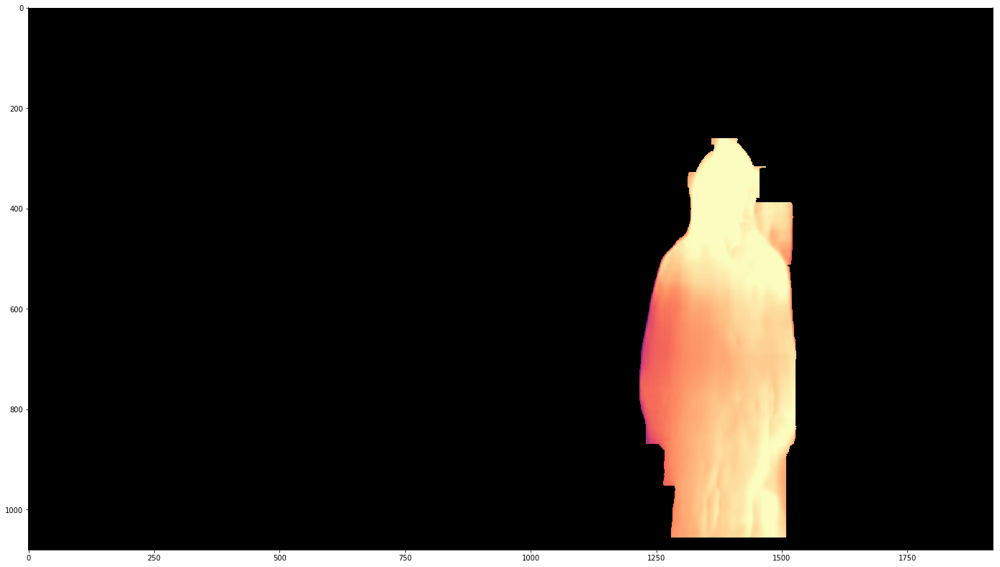

In [269]:
eg_img_nb = eliminate_background(eg_depth_img, eg_all_contours_y, eg_all_contours_x, True);

### Create mask and retrieve depth estimation information

We create a mask with the image to which we have eliminated the background and apply this mask to the depth information retrieved from the *.npy* file created by monodepth2 

In [259]:
def get_depth_data_mask(depth_data, img_nb, show=False):
    # Retrieve depth data (resized to the original input image size)    
    depth = depth_data[0][0]

    if(show):
        print("Before mask:")
        print("Min value:" ,np.min(depth),"/  Max value:",np.max(depth))
        print("Depth shape:", depth.shape, "/  Number of values:" , depth.shape[0]*depth.shape[1])
        print("")

    # Create mask from the image without background        
    mask = img_nb[:,:,1] != 0
    depth_mask = depth[mask]

    if(show):
        print("Depth mask values:", depth_mask)
        # These values are retrieved from *eliminate_background* example
        print("First value check:",depth[280][713],"/ Last value check:",depth[1056][822])  
        print("")

        print("After mask:")
        print("Min value:" ,np.min(depth_mask),"/  Max value:",np.max(depth_mask))
        print("Depth shape:", depth_mask.shape, "/  Number of values:" , depth_mask.shape[0])
    
    return depth_mask

#### E.g.

In [260]:
eg_depth_data_mask = get_depth_data_mask(eg_depth_data, eg_img_nb, True);

Before mask:
Min value: 0.046279885 /  Max value: 0.98041975
Depth shape: (1080, 1920) /  Number of values: 2073600

Depth mask values: [0.5477126  0.5507698  0.5535567  ... 0.60679436 0.6045387  0.60231197]
First value check: 0.20083894 / Last value check: 0.48472002

After mask:
Min value: 0.17637016 /  Max value: 0.7367929
Depth shape: (191389,) /  Number of values: 191389


### Calculate mean and standard deviation of the person trimmed shape

We retrieved the mean and standard deviation of the relative depth estimation. 
The mean will be used later on to estimate the absolute by multiplying by a scale. 
The standard deviation is used to understand how different colours may affect how disperse are the depth values for the pixels of the same object.To have a visualization of this, we create an histogram.

In [261]:
def calculate_mean_and_std(depth_data_mask, show=False):

    #depth_stack = np.hstack(depth_data_mask) #flat data if needed
    depth_stack = depth_data_mask

    # Mean and standard deviation
    mean = depth_stack.mean()
    #var = depth_stack.var()
    std = depth_stack.std()

    if(show):
        print("Mean:",mean)
        print("Standard deviation:",std)

        #Histogram build and representation
        hist = np.array(plt.hist(depth_stack, bins='auto'))
        plt.show()
        print("Histogram size: ", hist[0].size, ", ", hist[1].size)

    return mean, std

#### E.g.

Mean: 0.5891617
Standard deviation: 0.068395644


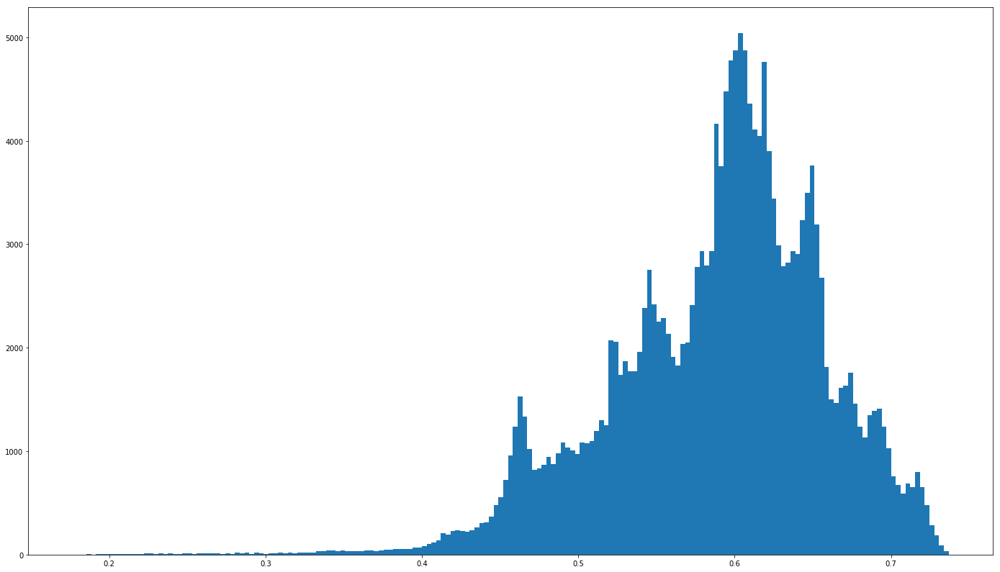

Histogram size:  183 ,  184


In [262]:
eg_mean, eg_std = calculate_mean_and_std(eg_depth_data_mask, True);

## Depth estimation algorithm in a whole

By using all the functions defined above we come up with the depth estimation algorithm which take an image, its corresponding depth image and data and returns the relative depth data constrained inside the person shape.

In [263]:
def depth_estimation_algorithm (img_path, depth_img_path, depth_data_path, show=False):
    #Run yolo
    img,boxes = YOLO_object_detection(img_path, show);
    #Retrieve bounding box vertexes
    bb_param = bb_vertexes(img, boxes, show);
    #No detected person --> return false
    if(not len(bb_param)):
        return False, False, False, False
    #Load depth image and data
    depth_img, depth_data = load_depth_img_data(depth_img_path, depth_data_path, show);
    #Compute low and high treshold
    low_t, high_t = calculate_low_high_threshold(depth_data, bb_param, show)
    #Canny edge detector
    object_contours = find_object_contours_canny(depth_img, bb_param, low_t, high_t, show);
    #Stack all contours
    all_contours, all_contours_y, all_contours_x = stack_contours(object_contours);
    #Eliminate background
    img_nb = eliminate_background(depth_img, all_contours_y, all_contours_x, show)    
    #Retrieve depth data constained inside the person shape
    depth_data_mask = get_depth_data_mask(depth_data, img_nb, False);
    #Calculate mean and standard deviation
    mean, std = calculate_mean_and_std(depth_data_mask, False);
    
    return img_nb, depth_data_mask, mean, std    

#### E.g Extremely close distance example



It took 2.344 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. person: 1.000000


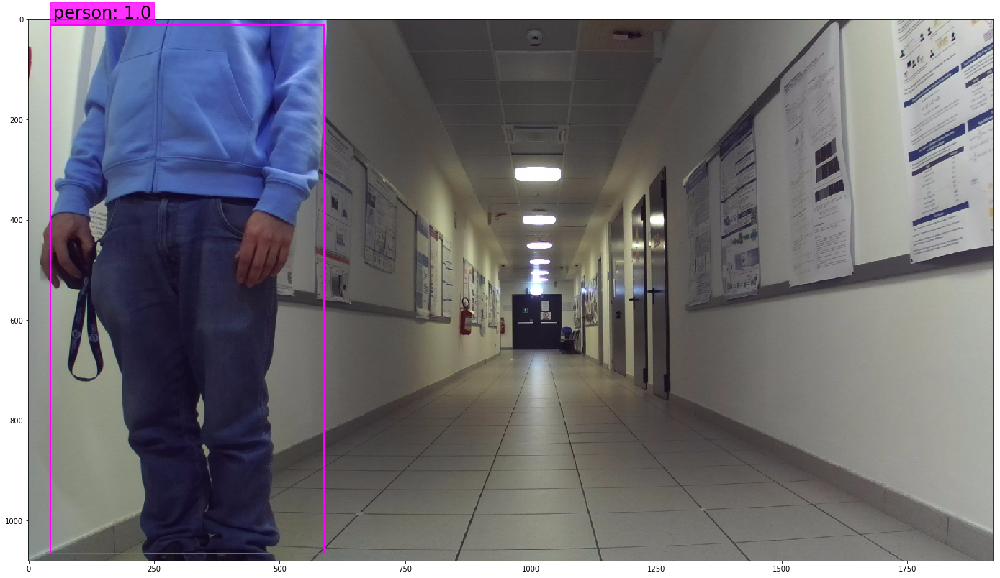

Box 0 --> x1,y1:( 44 , 11 ) / x2,y2:( 588 , 1066 )
Estimated depth information:
[[[[0.30622414 0.30628383 0.30638996 ... 0.32991266 0.33072552
    0.33118272]
   [0.30622414 0.30628383 0.30638996 ... 0.32991266 0.33072552
    0.33118272]
   [0.30587068 0.30592903 0.30603284 ... 0.33013237 0.33106846
    0.331595  ]
   ...
   [0.9999999  0.9999999  0.9999999  ... 0.63546574 0.6380594
    0.63951826]
   [0.9999998  0.9999998  0.9999998  ... 0.6355039  0.63810104
    0.639562  ]
   [0.99999994 0.99999994 0.99999994 ... 0.6355039  0.6381011
    0.639562  ]]]]
mean_norm inside bb: 0.7981819
low_t: 0.14636364857355752 / high_t: 0.29272729714711504


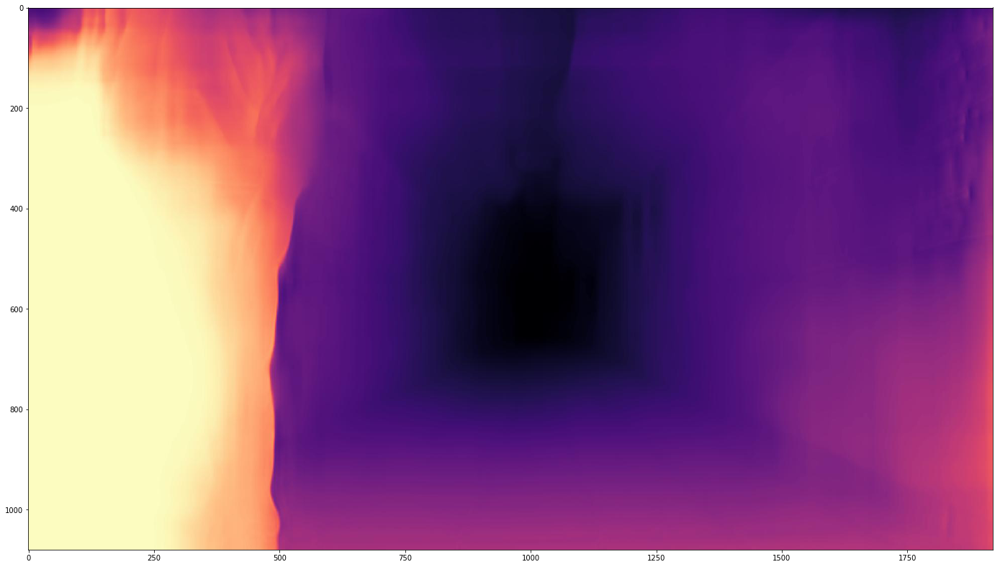

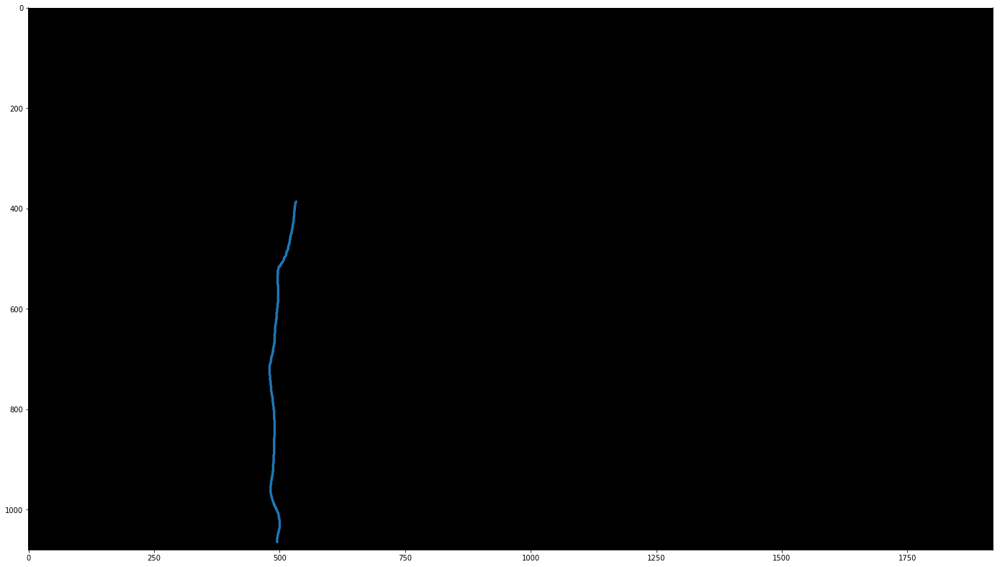

This values are retrieved to check the correctness of the mask later on
(Check 'Create mask and retrieve depth estimation information' above)

First y,x value of mask: 385 , 533
Last y,x value of mask: 1065 , 495
[0.49445456 0.4865144  0.4676674  0.47873473 0.47095513 0.46317554]
0.47691694


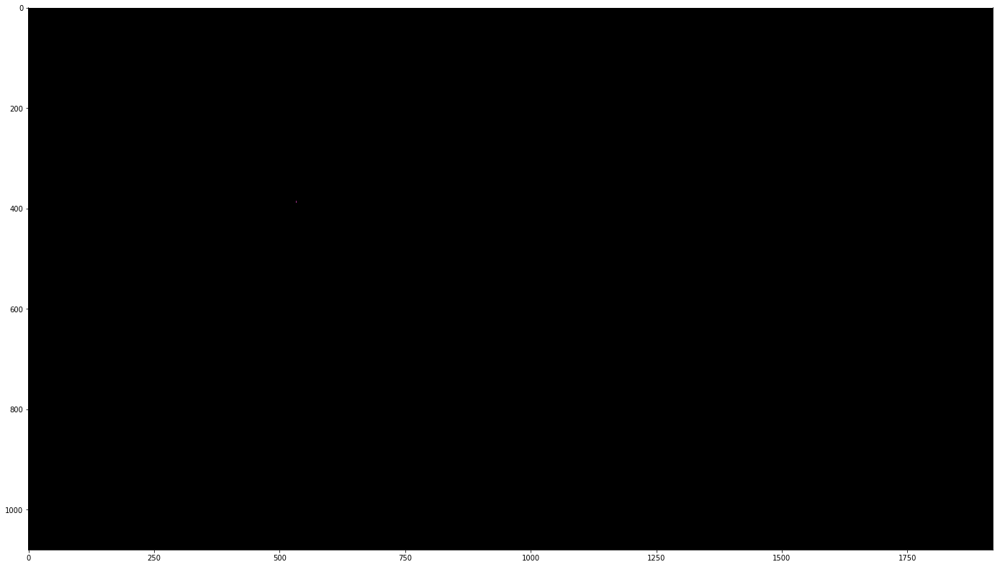

In [264]:
img_path = 'preprocessing-of-images/left-crop/L_CB_10.png'
depth_img_path = 'monodepth2/assets/monodepth2_output/L_CB_10_disp.jpeg'
depth_data_path = 'monodepth2/assets/monodepth2_output/L_CB_10_disp.npy'
img_nb, depth_data_mask, mean, std = depth_estimation_algorithm (img_path, depth_img_path, depth_data_path, True)
print(depth_data_mask)
print(mean)

#### E.g Closest distance example



It took 2.365 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. person: 1.000000


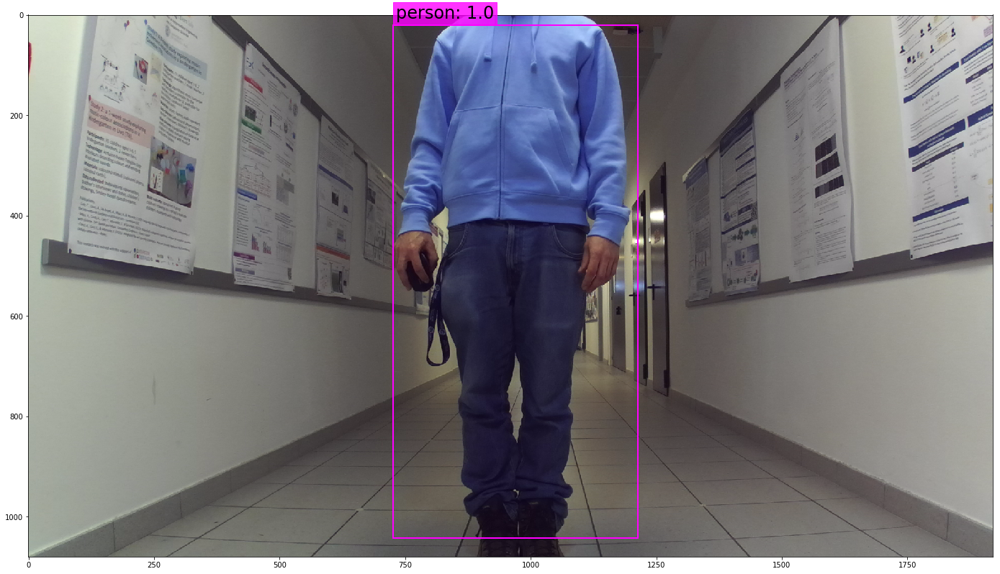

Box 0 --> x1,y1:( 726 , 20 ) / x2,y2:( 1214 , 1043 )
Estimated depth information:
[[[[0.35050067 0.34979084 0.34852895 ... 0.33192167 0.3327996
    0.33329344]
   [0.35050067 0.34979084 0.34852895 ... 0.33192167 0.3327996
    0.33329344]
   [0.35052213 0.3498327  0.34860706 ... 0.33206785 0.33305526
    0.33361062]
   ...
   [0.6225518  0.6225995  0.6226842  ... 0.62590146 0.62833995
    0.62971157]
   [0.6217509  0.62183446 0.621983   ... 0.6260017  0.6284478
    0.6298236 ]
   [0.6217509  0.62183446 0.62198305 ... 0.6260017  0.6284478
    0.6298237 ]]]]
mean_norm inside bb: 0.5995113
low_t: 0.11325188755989074 / high_t: 0.22650377511978148


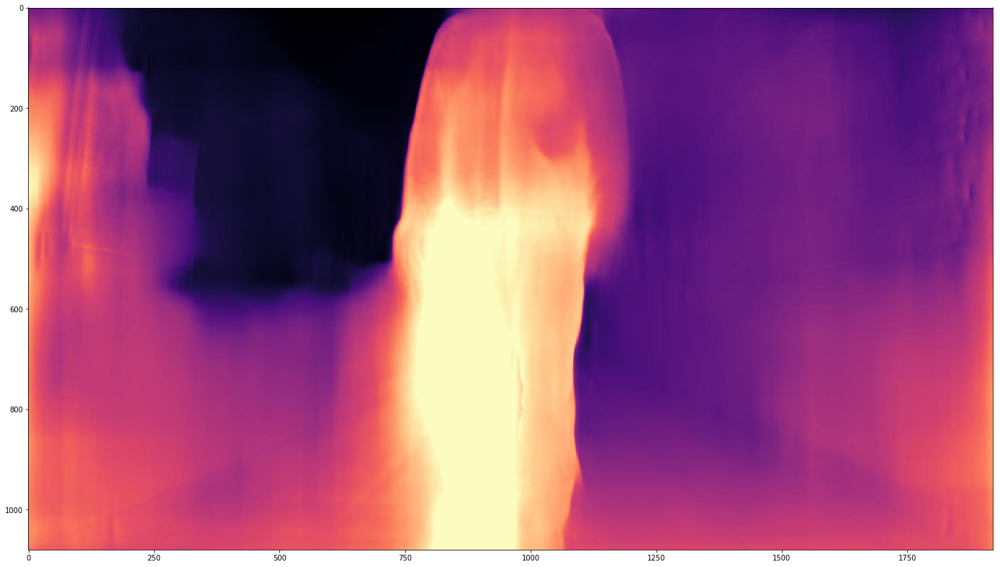

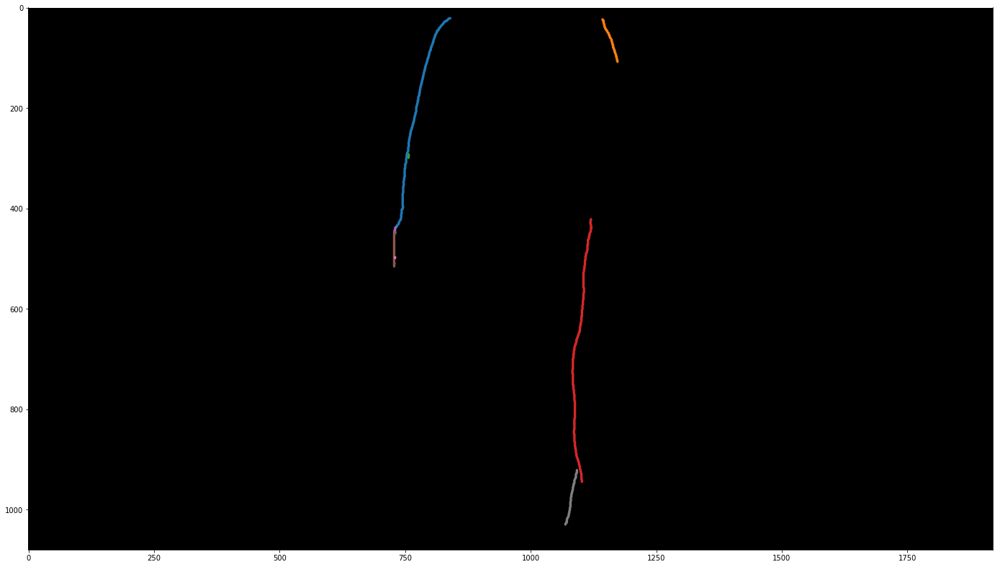

This values are retrieved to check the correctness of the mask later on
(Check 'Create mask and retrieve depth estimation information' above)

First y,x value of mask: 20 , 837
Last y,x value of mask: 1030 , 1069


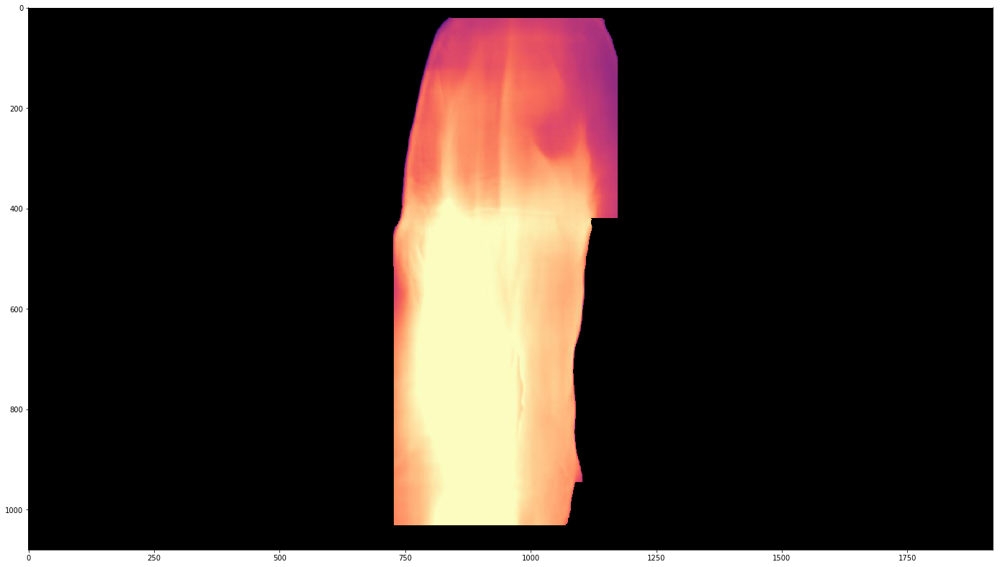

In [265]:
img_path = 'preprocessing-of-images/left-crop/L_CB_09.png'
depth_img_path = 'monodepth2/assets/monodepth2_output/L_CB_09_disp.jpeg'
depth_data_path = 'monodepth2/assets/monodepth2_output/L_CB_09_disp.npy'
img_nb, depth_data_mask, mean, std = depth_estimation_algorithm (img_path, depth_img_path, depth_data_path, True);

#### E.g Mid distance example



It took 2.329 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. person: 1.000000


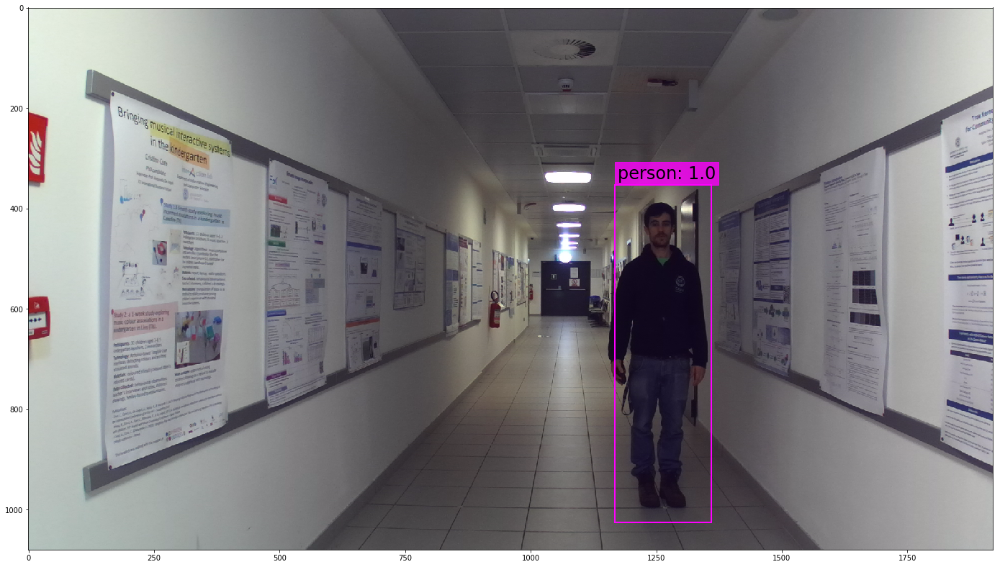

Box 0 --> x1,y1:( 1168 , 353 ) / x2,y2:( 1360 , 1025 )
Estimated depth information:
[[[[0.96418554 0.96370745 0.9628576  ... 0.960993   0.96125364
    0.9614002 ]
   [0.96418554 0.96370745 0.9628576  ... 0.960993   0.96125364
    0.9614002 ]
   [0.96413755 0.96366704 0.96283066 ... 0.96081895 0.9610921
    0.9612457 ]
   ...
   [0.51378274 0.5134543  0.51287043 ... 0.56885284 0.57092196
    0.57208586]
   [0.51409096 0.5138024  0.5132895  ... 0.56903034 0.5710894
    0.57224756]
   [0.514091   0.5138024  0.5132896  ... 0.5690304  0.5710894
    0.5722476 ]]]]
mean_norm inside bb: 0.3088587
low_t: 0.0648097821076711 / high_t: 0.1296195642153422


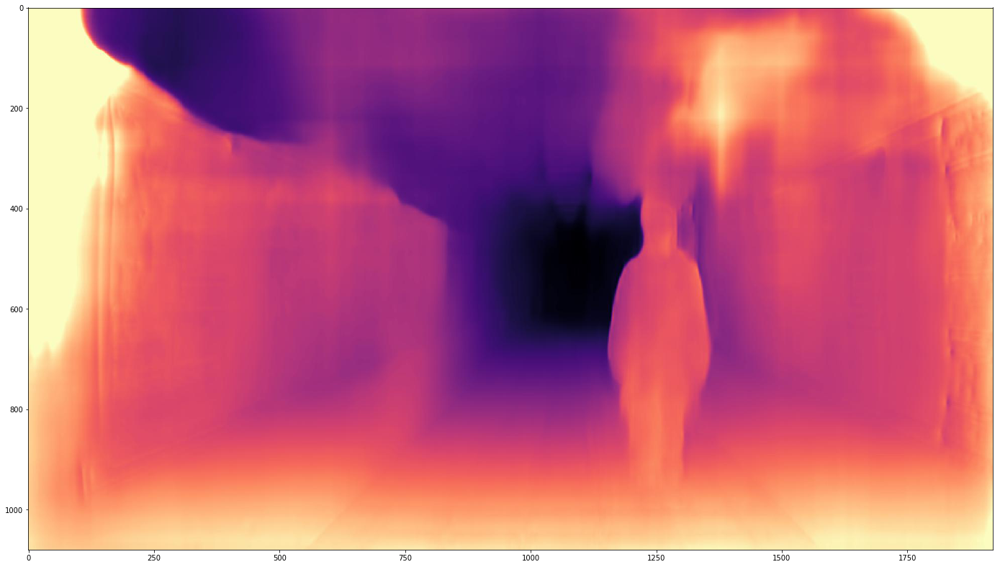

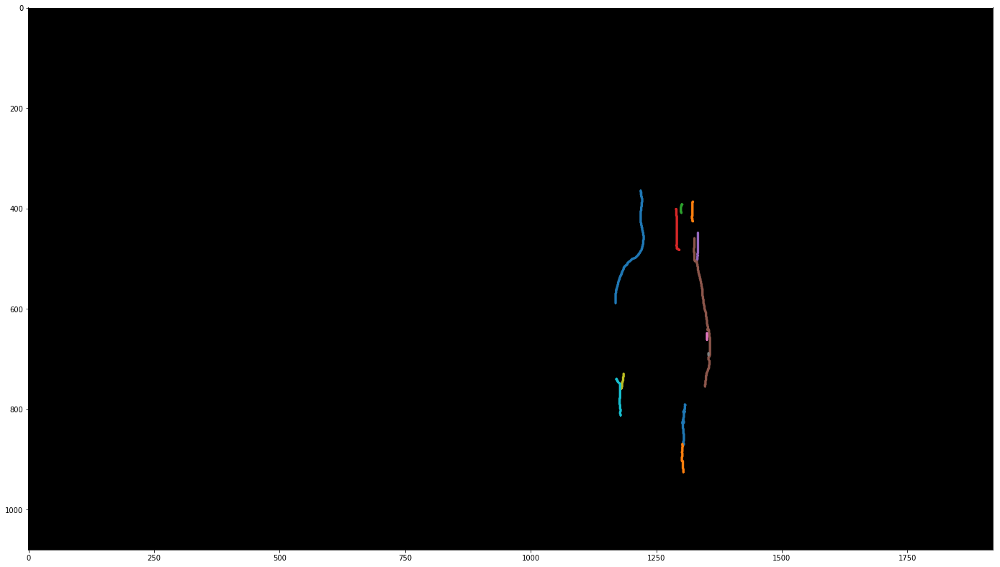

This values are retrieved to check the correctness of the mask later on
(Check 'Create mask and retrieve depth estimation information' above)

First y,x value of mask: 363 , 1219
Last y,x value of mask: 926 , 1304


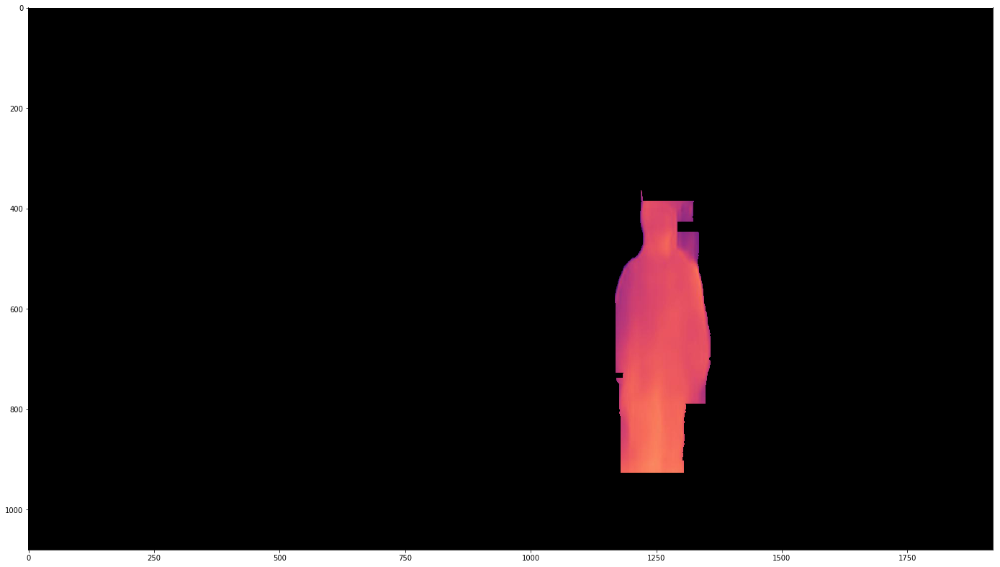

In [266]:
img_path = 'preprocessing-of-images/left-crop/H_DB_05.png'
depth_img_path = 'monodepth2/assets/monodepth2_output/H_DB_05_disp.jpeg'
depth_data_path = 'monodepth2/assets/monodepth2_output/H_DB_05_disp.npy'
img_nb, depth_data_mask, mean, std = depth_estimation_algorithm (img_path, depth_img_path, depth_data_path, True);

#### E.g Furthest distance example



It took 2.292 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. person: 1.000000


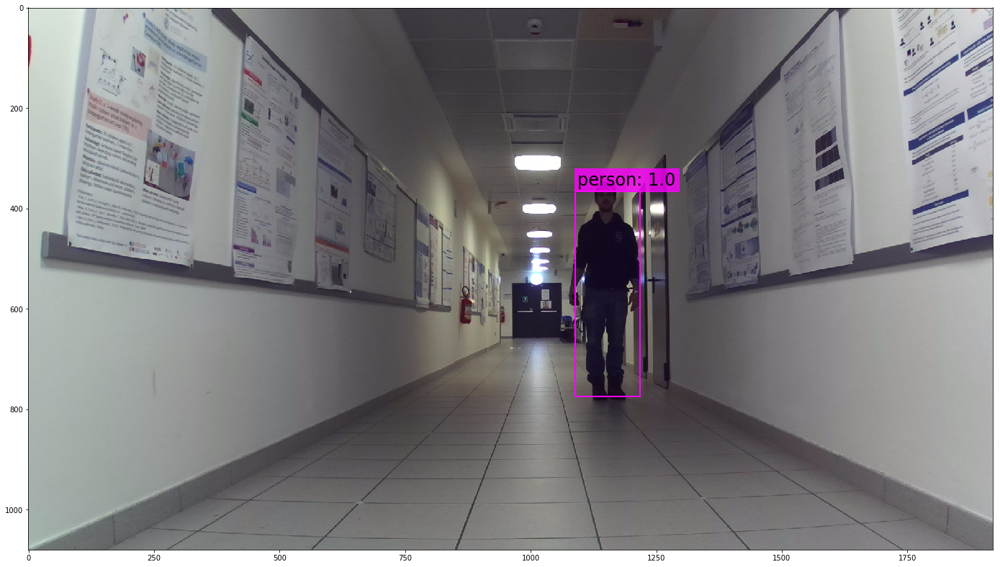

Box 0 --> x1,y1:( 1088 , 366 ) / x2,y2:( 1218 , 775 )
Estimated depth information:
[[[[0.4221606  0.42120683 0.41951132 ... 0.38993806 0.3905882
    0.3909539 ]
   [0.4221606  0.42120683 0.41951132 ... 0.38993806 0.3905882
    0.3909539 ]
   [0.422507   0.4215817  0.41993666 ... 0.389971   0.3906789
    0.39107716]
   ...
   [0.6020678  0.6023192  0.60276604 ... 0.6342705  0.6368485
    0.6382987 ]
   [0.6013891  0.60168415 0.60220873 ... 0.63437486 0.63695747
    0.63841015]
   [0.60138917 0.6016842  0.60220885 ... 0.6343749  0.6369575
    0.6384102 ]]]]
mean_norm inside bb: 0.17115621
low_t: 0.041859368781248726 / high_t: 0.08371873756249745


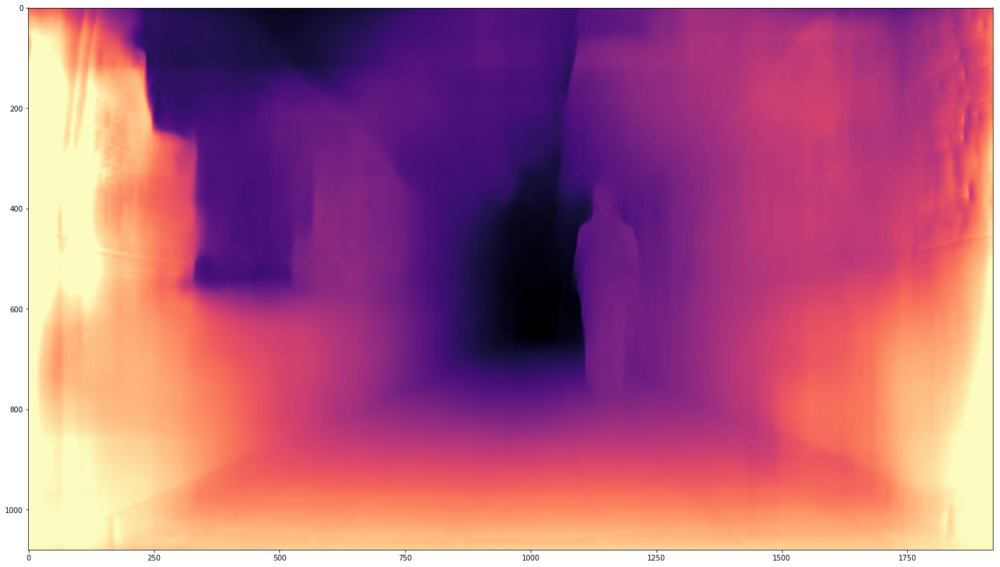

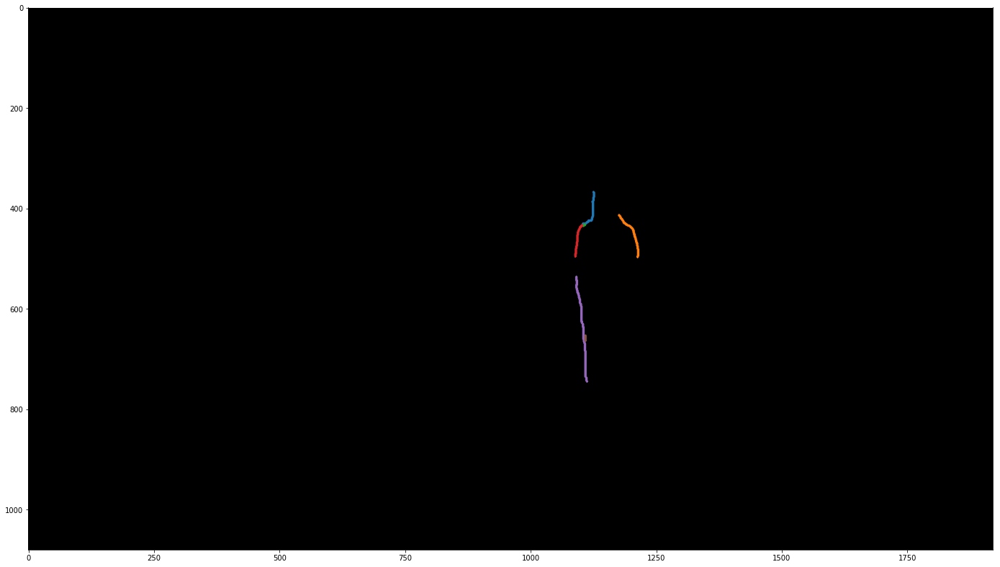

This values are retrieved to check the correctness of the mask later on
(Check 'Create mask and retrieve depth estimation information' above)

First y,x value of mask: 366 , 1125
Last y,x value of mask: 745 , 1213


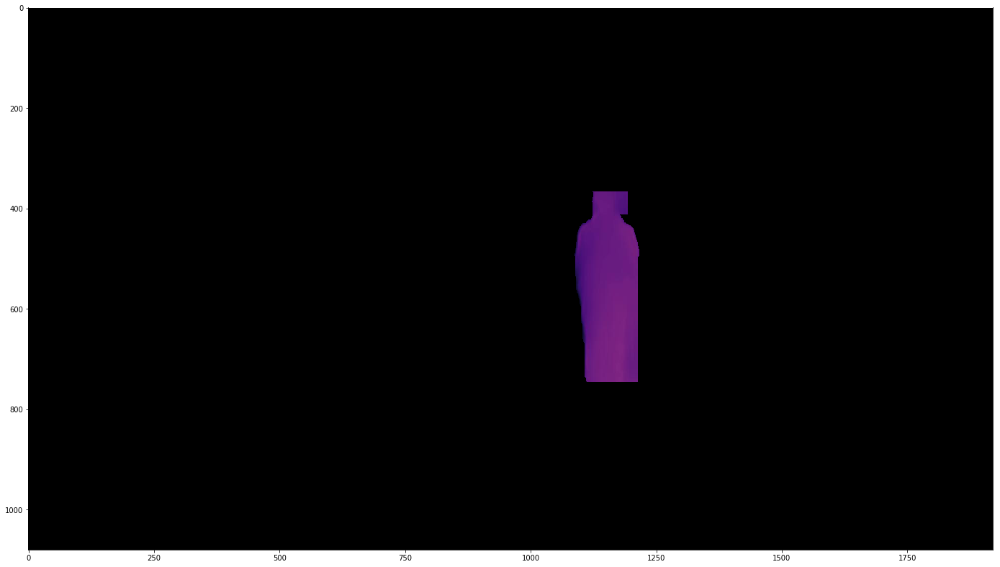

In [267]:
img_path = 'preprocessing-of-images/left-crop/L_DB_02.png'
depth_img_path = 'monodepth2/assets/monodepth2_output/L_DB_02_disp.jpeg'
depth_data_path = 'monodepth2/assets/monodepth2_output/L_DB_02_disp.npy'
img_nb, depth_data_mask, mean, std = depth_estimation_algorithm (img_path, depth_img_path, depth_data_path, True);

#### Empty corridor example



It took 2.270 seconds to detect the objects in the image.

Number of Objects Detected: 0 

Objects Found and Confidence Level:



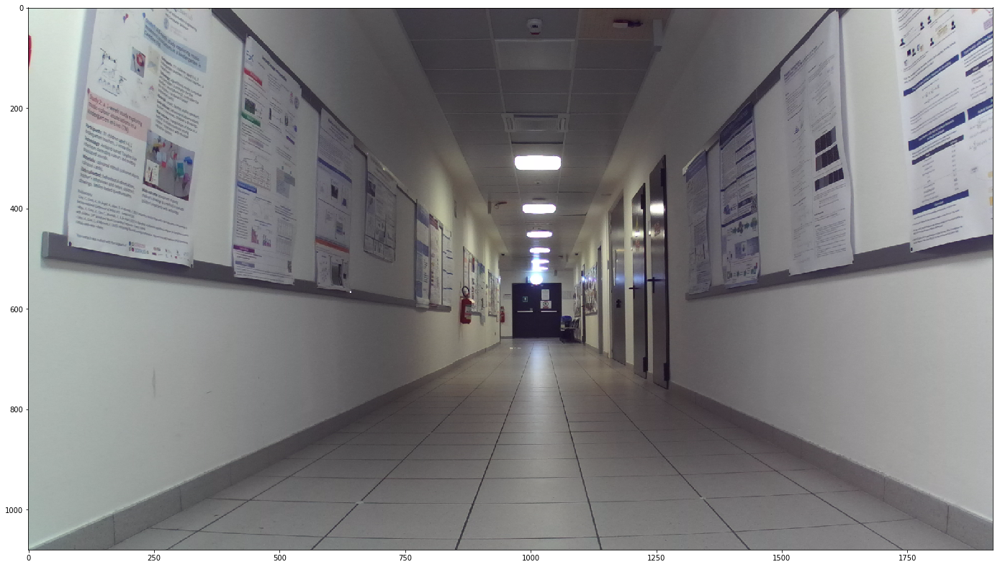

False False False False


In [268]:
img_path = 'preprocessing-of-images/left-crop/L_empty_corridor.png'
depth_img_path = 'monodepth2/assets/monodepth2_output/L_empty_corridor_disp.jpeg'
depth_data_path = 'monodepth2/assets/monodepth2_output/L_empty_corridor_disp.npy'
img_nb, depth_data_mask, mean, std = depth_estimation_algorithm (img_path, depth_img_path, depth_data_path, True);
print(img_nb, depth_data_mask, mean, std)

# Run the depth algorithm in our baseline

Once we have ensured that our algorithm works in all the possible base cases, we run it  our baseline and save the relative depth estimation data for further processing and the crop image to ensure the correctness of the depth estimation data.

#### Save images and .npy file function

In [329]:
def save_depth_alg_info(file_number, img_path, img_nb, depth_data_mask):
    #Retrieve name of file
    filename_w_ext = os.path.basename(img_path)
    filename, _ = os.path.splitext(filename_w_ext)
    print("File number " + str(file_number) + ": " + filename)
    print("-----------------------------------------------------------------")
    
    if type(img_nb) is bool: #no person detected       
        print("No person detected for " + filename)
    
    else: 
        #save img_nb
        if(cv2.imwrite('./results/' + filename + '_nb' + ".jpeg", img_nb)):
            print(filename + " saved successfully")
        else:
            print("Error saving " + filename + '_nb')
        #save histogram
        depth_stack = depth_data_mask
        plt.hist(depth_stack, bins='auto');
        plt.savefig('./results/' + filename + '_hist' + file_extension);
        plt.close()

        #save .npy
        np.save('./results/' + filename + '_disp_mask',depth_data_mask)        

    print("") #double space
    print("")

#### E.g.

In [330]:
img_path = 'preprocessing-of-images/left-crop/L_DB_02.png'
depth_img_path = 'monodepth2/assets/monodepth2_output/L_DB_02_disp.jpeg'
depth_data_path = 'monodepth2/assets/monodepth2_output/L_DB_02_disp.npy'

img_nb, depth_data_mask, mean, std = depth_estimation_algorithm (img_path, depth_img_path, depth_data_path)

save_depth_alg_info(0,img_path, img_nb, depth_data_mask)

#Check that files has been saved correctly
print(mean, std)
_, ex_depth_data = load_depth_img_data(depth_img_path, 'results/L_DB_02_disp_mask.npy');
ex_mean, ex_std = calculate_mean_and_std(depth_data_mask);
print(ex_mean, ex_std)



It took 2.768 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 0: L_DB_02
-----------------------------------------------------------------
L_DB_02 saved successfully


0.22579244 0.020300852
0.22579244 0.020300852


#### Running the depth estimation algorrithm in our baseline

In [331]:
img_dir = 'preprocessing-of-images/left-crop/'
depth_dir = 'monodepth2/assets/monodepth2_output/'
file_number = 0
for filename_w_ext in os.listdir(img_dir): 
    #img path
    img_path = os.path.join(img_dir, filename_w_ext)
    # retrieve filename without extension
    filename, _ = os.path.splitext(filename_w_ext)
    # depth img path
    depth_img_path = depth_dir + filename + '_disp.jpeg'
    #depth data path
    depth_data_path = depth_dir + filename + '_disp.npy'
    
    #Run depth algorithm
    img_nb, depth_data_mask, _, _ = depth_estimation_algorithm (img_path, depth_img_path, depth_data_path)
    
    #Save files
    file_number += 1
    save_depth_alg_info(file_number,img_path, img_nb, depth_data_mask)
    



It took 2.328 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 1: L_G_01
-----------------------------------------------------------------
L_G_01 saved successfully




It took 2.312 seconds to detect the objects in the image.

Number of Objects Detected: 0 

File number 2: H_empty_corridor
-----------------------------------------------------------------
No person detected for H_empty_corridor




It took 2.340 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 3: L_G_04
-----------------------------------------------------------------
L_G_04 saved successfully




It took 2.308 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 4: L_G_10
-----------------------------------------------------------------
L_G_10 saved successfully




It took 2.266 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 5: H_CB_07
------------------------





It took 2.332 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 40: L_CB_01
-----------------------------------------------------------------
L_CB_01 saved successfully




It took 2.961 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 41: H_G_11
-----------------------------------------------------------------
H_G_11 saved successfully




It took 2.345 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 42: L_CB_02
-----------------------------------------------------------------
L_CB_02 saved successfully




It took 2.310 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 43: H_DB_03
-----------------------------------------------------------------
H_DB_03 saved successfully




It took 2.318 seconds to detect the objects in the image.

Number of Objects Detected: 1 

File number 44: H_G_02
------------------------------------

# Next steps

## Compute scale and estimated absolute depth
Baseline is composed by images taken from two heights, three outfit colours and eleven positions.
Every picture is named to show this three parameters to easily distinguish between configurations.

Being the name A_B_C:
- A: L for low configuration of the camera (roughly knee height) and H for heigh configuration of the camera (roughly shoulder height)
- B: G for green t-shirt, DB for dark blue hoodie, CB for clear blue hoodie and C for computer screen object
- C: Numbers indicating 11 different positions divided in 7 depth levels. Being 1 & 2 the furthest and 10 & 11 the closest.

The idea is to compare the absolute depth estimation in the two configurations of the camera (low and high) separately.

For each configuration, a scale will be compute for each of the three colours and eleven positions (33 scales in total). 

Then, each scale will be apply to the 33 different relative depths to understand which of the scales result in a better estimation of the absolute depth for the overall configuration. In this way, we can understand how colour, distance and camera configuration affects to the accuracy of the algorithm developed in this notebook (and therefore, to the monodepth2 algorithm) when it comes to estimate the absolute depth of a person in a closed enviroment.

# Considerations and future work

- This project has designed to work also with scenarios where several people appears. However, it has been tested for a single person in the scene only. Minor or major adjustment could be necessary due to some unconsidered factors.